#Pytorch Object Detection Models
[Source](https://pytorch.org/vision/stable/models.html?#object-detection-instance-segmentation-and-person-keypoint-detection)

| Model Name | COCO mAP| 
| --- | --- | 
| FCOS ResNet-50 FPN | 39.2 |  
| Mask R-CNN ResNet-50 FPN | 37.9 |
| Faster R-CNN ResNet-50 FPN | 37 |

### Connecting to the Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


Inferencing source https://haochen23.github.io/2020/04/object-detection-faster-rcnn.html#.YmU-1S8RppQ

Training source https://towardsdatascience.com/building-your-own-object-detector-pytorch-vs-tensorflow-and-how-to-even-get-started-1d314691d4ae#8863

### **Interferencing**

#### All Required imports

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt 
from PIL import Image
import torch
import torchvision.transforms as T
import torchvision
import numpy as np 
import cv2
import warnings
warnings.filterwarnings('ignore')
import sys

### Load the model to be infered


1.   maskrcnn_resnet50_fpn
2.   fasterrcnn_resnet50_fpn
3.   fcos_resnet50_fpn

In [3]:
# Loading Pre Trained Model 
# uncomment to use
# model = torchvision.models.detection.fcos_resnet50_fpn(pretrained=True)

# uncommet to use
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# uncommet to use
# model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
# set to evaluation mode
model.eval()

# load the COCO dataset category names
# we will use the same list for this notebook
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

### Detect prediction on the image with selected cofidence

In [4]:
def get_prediction(img_path, confidence):
  """
  get_prediction
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - class, box coordinates are obtained, but only prediction score > threshold
        are chosen.
    
  """
  img = Image.open(img_path)
  transform = T.Compose([T.ToTensor()])
  img = transform(img)
  pred = model([img])

  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
  pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
  pred_score = list(pred[0]['scores'].detach().numpy())

  pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
  pred_boxes = pred_boxes[:pred_t+1]
  print("pred_class: ",pred_class[:pred_t+1])
  pred_class = pred_class[:pred_t+1]
  print("pred_class: ",pred_score[:pred_t+1])
  pred_score = pred_score[:pred_t+1]
  return pred_boxes, pred_class, pred_score

### Detect object based in inputs

1.   Image input and output path, 
2.   Confidence of predicition,
3.   Thickness of bounding box to be plotted
4.   Size of text to be plotted
5.   Thickness of the text to be plotted


In [5]:
def detect_object(img_path,image_save_path, confidence=0.5, rect_th=1, text_size=1, text_th=1):
  """
  object_detection_api
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
      - rect_th - thickness of bounding box
      - text_size - size of the class label text
      - text_th - thichness of the text
    method:
      - prediction is obtained from get_prediction method
      - for each prediction, bounding box is drawn and text is written 
        with opencv
      - the final image is displayed
  """
  boxes, pred_cls, pred_src = get_prediction(img_path, confidence)
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  # print(len(boxes))
  # pt1, pt2 = (423, 103), (531, 358)
  # pt1, pt2 = boxes[i][0], boxes[i][1]
  # text = 'Man 0.9'
  # text = label

  fontFace = cv2.FONT_HERSHEY_COMPLEX_SMALL
  fontScale = 1
  thickness = 1
  for i in range(len(boxes)):
    cv2.rectangle(img, boxes[i][0], boxes[i][1], thickness=rect_th, color=(0, 255, 0))
    # cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th)
    label = ': '.join([pred_cls[i],str(round(pred_src[i],4))])    
    retval, baseLine = cv2.getTextSize(label,fontFace=fontFace,fontScale=fontScale, thickness=thickness)
    topleft = (boxes[i][0][0], boxes[i][1][1] - retval[1])
    bottomright = (int(topleft[0] + retval[0]), int(topleft[1] + retval[1]))
    cv2.rectangle(img, (int(topleft[0]), int(topleft[1] - baseLine)), bottomright,thickness=-1, color=(0, 255, 0))
    cv2.putText(img, label, (int(boxes[i][0][0]), int(boxes[i][1][1]-baseLine)), fontScale=fontScale,fontFace=fontFace, thickness=thickness, color=(0,0,0))

    # (label_width, label_height), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, text_size, text_th)
    # label_patch = np.zeros((label_height + baseline, label_width, 3), np.uint8)
    # label_patch[:,:] = 254
    # cv2.putText(label_patch, label, (0, label_height), cv2.FONT_HERSHEY_SIMPLEX, 1, [255,0,0], 1)
    # cv2.putText(img,': '.join([pred_cls[i],str(round(pred_src[i],2))]), boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)

  cv2.imwrite(image_save_path, cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.figure(figsize=(20,30))
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()

### Path of the image those have to be tested
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-0.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-46.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-60.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-73.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-82.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-91.jpg',
'/content/drive/MyDrive/Tensorflow/dataset/images/femaleconnector-123.jpg',

pred_class:  ['person', 'donut', 'person', 'cell phone', 'person', 'kite', 'person', 'book', 'cell phone', 'hot dog', 'person', 'snowboard']
pred_class:  [0.9103189, 0.56306267, 0.46105078, 0.43337855, 0.37587455, 0.23940834, 0.23344852, 0.22271748, 0.19721383, 0.19587973, 0.18063311, 0.18055677]


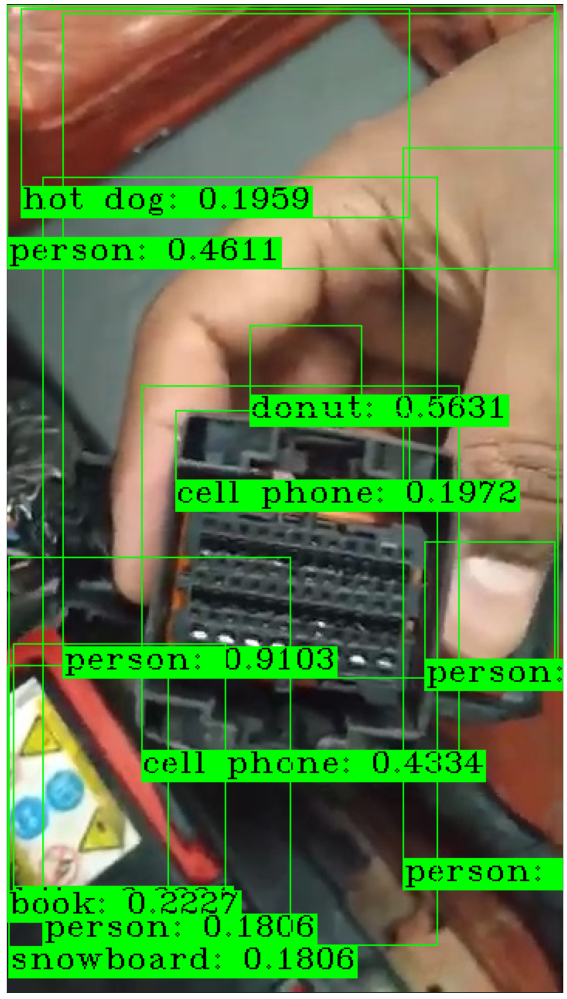

In [17]:
source_path = "/content/drive/MyDrive/Tensorflow2/dataset/images/femaleconnector-82.jpg"
destination_path = "/content/drive/MyDrive/PytorchObjectDetector/results/fasterrcnn_resnet50_fpn/femaleconnector-82-fasterrcnn_resnet50_fpn.jpg"
detect_object(source_path,destination_path, confidence=0.15)

# **Train**

### Check Pycocotools installation

In [ ]:
import pycocotools

### Connecting to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


### Change Directory

In [ ]:
import os
os.chdir("/content/drive/MyDrive/PytorchObjectDetector/")

### Clone Pytorch repo and copy some python files as pip install does not install few files 

In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

fatal: destination path 'vision' already exists and is not an empty directory.
error: Your local changes to the following files would be overwritten by checkout:
	.circleci/build_docs/commit_docs.sh
	.circleci/regenerate.py
	.circleci/unittest/android/scripts/install_gradle.sh
	.circleci/unittest/ios/scripts/binary_ios_build.sh
	.circleci/unittest/linux/scripts/install.sh
	.circleci/unittest/linux/scripts/post_process.sh
	.circleci/unittest/linux/scripts/run-clang-format.py
	.circleci/unittest/linux/scripts/run_test.sh
	.circleci/unittest/linux/scripts/setup_env.sh
	android/gradlew
	ios/VisionTestApp/clean.sh
	ios/VisionTestApp/setup.sh
	ios/build_ios.sh
	packaging/build_cmake.sh
	packaging/build_conda.sh
	packaging/build_wheel.sh
	scripts/fbcode_to_main_sync.sh
Please commit your changes or stash them before you switch branches.
Aborting


### Check Cuda Version on the colab

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


### Install appropriate torch version for the Cuda detected on colab
From this [INSTALLING PREVIOUS VERSIONS OF PYTORCH](https://pytorch.org/get-started/previous-versions/#installing-previous-versions-of-pytorch)

In [ ]:
!pip install torchvision==0.12.0

In [ ]:
!pip show torchvision

Name: torchvision
Version: 0.12.0+cu113
Summary: image and video datasets and models for torch deep learning
Home-page: https://github.com/pytorch/vision
Author: PyTorch Core Team
Author-email: soumith@pytorch.org
License: BSD
Location: /usr/local/lib/python3.7/dist-packages
Requires: torch, requests, numpy, typing-extensions, pillow
Required-by: fastai


In [ ]:
import torch

print(torch.__version__)

1.11.0+cu113


In [ ]:
!python -V

Python 3.7.13


In [ ]:
#CPU
!pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cpu

#OR

#GPU
# !pip install torch==1.10.1+cu111 torchvision==0.11.2+cu111 torchaudio==0.10.1 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cpu


### Imports

In [ ]:
import os
os.chdir("/content/drive/MyDrive/PytorchObjectDetector/")
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import pandas as pd

from engine import train_one_epoch, evaluate
import utils
import transforms as T
import torchvision

###Extract position of annotated objects from the csv file 

In [ ]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    #(xmin, ymin, xmax, ymax)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin","x_width", "y_height"]].values
    boxes_array[0][2]+=boxes_array[0][0]
    boxes_array[0][3]+=boxes_array[0][1]
    return boxes_array

###FemaleConnectorDataset class

In [ ]:
class FemaleConnectorDataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = sorted(os.listdir(os.path.join(root, "images")))
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        # load images and bounding boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file,self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            # print("img type: ",type(img),"target type: ",type(target))
            # print(target)
            img, target = self.transforms(img, target)
            
        return img, target
    def __len__(self):
            return len(self.imgs)

###Checking implementation of FemaleConnectorDataset

In [ ]:
dataset = FemaleConnectorDataset(root = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
data_file = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv")
dataset.__getitem__(9)

(<PIL.Image.Image image mode=RGB size=640x360 at 0x7FCE665FBBD0>,
 {'area': tensor([117040.]),
  'boxes': tensor([[ 55.,  80., 473., 360.]]),
  'image_id': tensor([9]),
  'iscrowd': tensor([0]),
  'labels': tensor([1])})

Expected output

```
(<PIL.Image.Image image mode=RGB size=650x417 at 0x7FE20F358908>,  {'area': tensor([141120.]),
 'boxes': tensor([[ 81.,  88., 522., 408.]]),   
 'image_id': tensor([0]),   
 'iscrowd': tensor([0]),   
 'labels': tensor([1])})
```

### **maskrcnn_resnet50_fpn** Training

### Checking trainable parameters of maskrcnn_resnet50_fpn

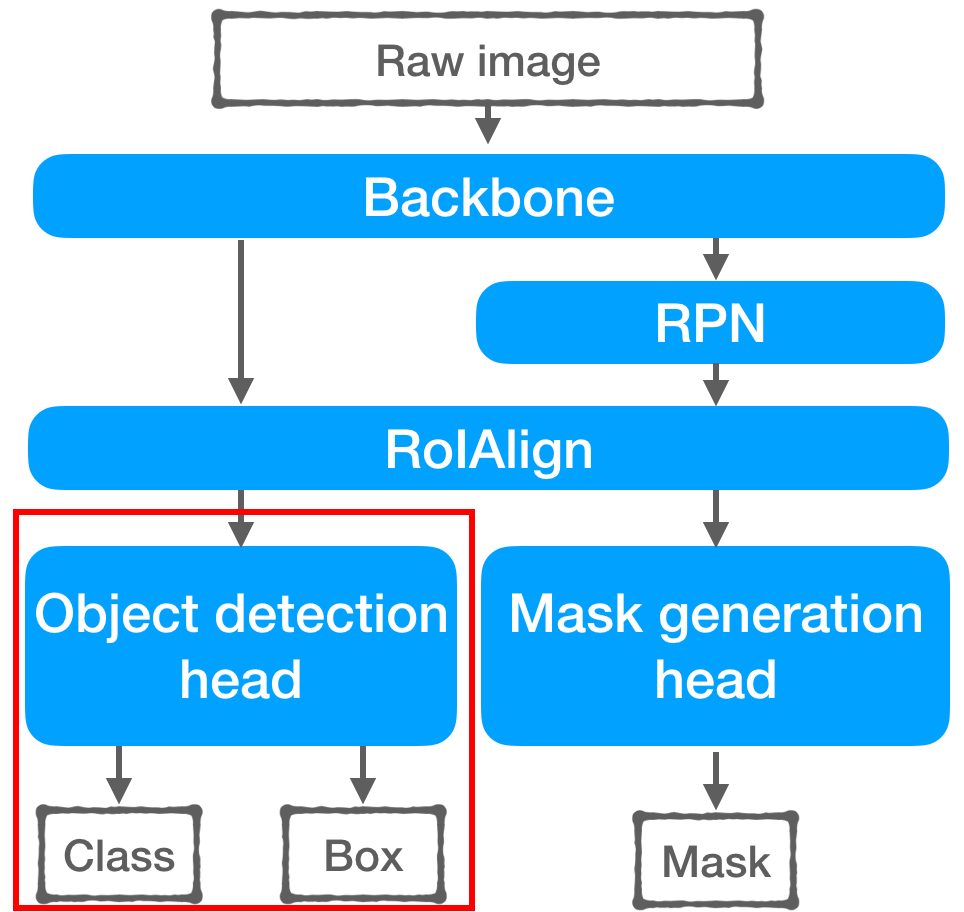

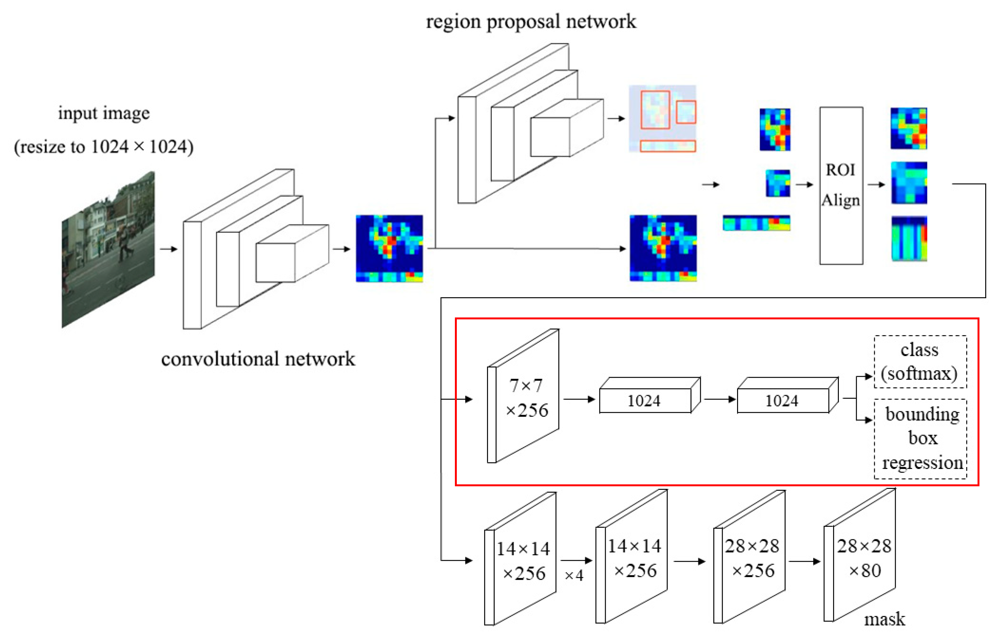

### Parameters those need to be trained on the new data 

| Name of parameters | Requires_gradient bool value | 
| --- | --- | 
| roi_heads.box_predictor.cls_score.weight | True |  
| roi_heads.box_predictor.cls_score.bias | True |
| roi_heads.box_predictor.bbox_pred.weight | True |
| roi_heads.box_predictor.bbox_pred.bias | True|

### [Defining The Dataset](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html?#defining-the-dataset)

### **One note on the labels.** 

The model considers class `0` as `background`. If your dataset does not contain the `background` class, you **should not have 0 in your labels**. 

### **For example:** 

Assuming you have just two classes, `cat` and `dog`, you can define 1 (not 0) to `represent cats` and 2 to `represent dogs`. So, for instance, if one of the images has both classes, your labels tensor should look like [1,2].


### Index of **77** containing label **Cell Phone** seems to have the features that will be helpful in transfer learning for our new data

Loading the **weights** & **bias** of **class score** & **bounding box** of **77th Cell Phone Label** in the final layers of detection

In [ ]:
def get_model(selected_label = 77):

    # load an object detection model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
    
    selected_roi_heads_box_predictor_cls_score_weight = 0
    selected_roi_heads_box_predictor_bbox_pred_weight = 0
    selected_roi_heads_box_predictor_cls_score_bias = 0
    selected_roi_heads_box_predictor_bbox_pred_bias = 0

    # List out all the name of the parameters whose gradient can be altered for further training
    for name, param in model.named_parameters():

        # If requires gradient parameters
        if param.requires_grad:
            if name != "roi_heads.box_predictor.cls_score.weight" or name != "roi_heads.box_predictor.cls_score.bias" or name != "roi_heads.box_predictor.bbox_pred.weight" or name != "roi_heads.box_predictor.bbox_pred.bias":
                param.requires_grad = False
                
            if name == "roi_heads.box_predictor.cls_score.weight":

                print("Replacing",name,"layer containing 90 class scores weight, with",selected_label,"th class score weight")

                print("####################################")
                print("Orgin layer size(0:Background + 90 classes): ",param.data.size())
                selected_roi_heads_box_predictor_cls_score_weight = torch.tensor(param.data[selected_label][:].reshape([1, 1024]))
                param.data = torch.cat([param.data[:1], selected_roi_heads_box_predictor_cls_score_weight])
                print("Altered layer size(0:Background +",selected_label,"th class): ",param.data.size())
                print("####################################")
                print("Enabling requires gradient for",name,"layer")
                param.requires_grad = True

            if name == "roi_heads.box_predictor.bbox_pred.weight":
                print("Replacing",name,"layer containing 90 class bbox predicition weight, with",selected_label,"th bbox predicition weight")
                # Size of the classes
                
                print("####################################")
                print("Orgin layer size(0:Background(4) + 90 classes(4)): ",param.data.size())
                # Orgin layer size:  torch.Size([364, 1024])
                # Altered layer size:  torch.Size([4, 1024])
                selected_roi_heads_box_predictor_bbox_pred_weight = torch.tensor(param.data[(selected_label)*4:(selected_label+1)*4][:].reshape([4, 1024]))
                param.data = torch.cat([param.data[:4], selected_roi_heads_box_predictor_bbox_pred_weight])
                print("Altered layer size(0:Background(4) +",selected_label,"th class(4)): ",param.data.size())
                print("####################################")
                print("Enabling requires gradient for",name,"layer")
                param.requires_grad = True


            if name == "roi_heads.box_predictor.cls_score.bias" or name == "roi_heads.box_predictor.bbox_pred.bias":
                
                if name == "roi_heads.box_predictor.cls_score.bias":
                    print("Replacing",name,"layer containing 90 class score bias, with",selected_label,"th class score bias")
                    print("####################################")
                    print("Original layer size(0:Background + 90 classes): ",param.data.size())
                    selected_roi_heads_box_predictor_cls_score_bias = param.data[selected_label:selected_label+1]
                    param.data = torch.cat([param.data[:1], selected_roi_heads_box_predictor_cls_score_bias])
                    print("Alteres layer size(0:Background +",selected_label,"th class): ",param.data.size())
                    print("####################################")
                    print("Enabling requires gradient for",name,"layer")
                    param.requires_grad = True

                if name == "roi_heads.box_predictor.bbox_pred.bias":
                    print("Replacing",name,"layer containing 90 class bbox predicition bias, with",selected_label,"th bbox predicition bias")
                    print("####################################")
                    print("Original layer size(0:Background(4) + 90 classes(4)): ",param.data.size())
                    selected_roi_heads_box_predictor_bbox_pred_bias = param.data[(selected_label-1)*4:selected_label*4]
                    param.data = torch.cat([param.data[:4], selected_roi_heads_box_predictor_bbox_pred_bias])
                    print("Alteres layer size(0:Background(4) +",selected_label,"class(4)): ",param.data.size())
                    print("####################################")
                    print("Enabling requires gradient for",name,"layer")       
                    param.requires_grad = True
            # Name and value of the parameter
            print("Name: ",name,"\nTrain: ",param.requires_grad,"\n")
      
    return model

### Data augmentation 

In [ ]:
def get_transform(train):
   transformsL = []
   # converts the image, a PIL image, into a PyTorch Tensor
   transformsL.append(T.ToTensor())
   if train:
      # during training, randomly flip the training images
      # and ground-truth for data augmentation
      transformsL.append(T.RandomHorizontalFlip(0.5))
   return T.Compose(transformsL)


1.   Instantiate training and testing data classes
2.   Data loader to control image loading during training and testing



In [ ]:
# use our dataset and defined transformations
dataset = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/",
          data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
          transforms = get_transform(train=True))
dataset_test = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
               data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
               transforms = get_transform(train=False))
# split the dataset in train and test set
torch.manual_seed(1)
total_number_of_images = len(dataset)
test_percentage_images = 20
total_number_of_test_images = int(total_number_of_images*(test_percentage_images/100))
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-total_number_of_test_images])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-total_number_of_test_images:])
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=2, shuffle=True, num_workers=4,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=4,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1890 examples, 1512 are training and 378 testing


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Training the Model

### Use `GPU` if available else `CPU` 

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

### Load `Pre-trained` `weight` and `bias` of the 77th label `Cell Phone` as the trainable parameters and only detection for this model being trained

In [ ]:
# our dataset has two classes only - raccoon and not racoon
selected_label = 77
# get the model using our helper function
model = get_model(selected_label)
# move model to the right device
model.to(device)

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

Name:  backbone.body.layer2.0.conv1.weight 
Train:  False 

Name:  backbone.body.layer2.0.conv2.weight 
Train:  False 

Name:  backbone.body.layer2.0.conv3.weight 
Train:  False 

Name:  backbone.body.layer2.0.downsample.0.weight 
Train:  False 

Name:  backbone.body.layer2.1.conv1.weight 
Train:  False 

Name:  backbone.body.layer2.1.conv2.weight 
Train:  False 

Name:  backbone.body.layer2.1.conv3.weight 
Train:  False 

Name:  backbone.body.layer2.2.conv1.weight 
Train:  False 

Name:  backbone.body.layer2.2.conv2.weight 
Train:  False 

Name:  backbone.body.layer2.2.conv3.weight 
Train:  False 

Name:  backbone.body.layer2.3.conv1.weight 
Train:  False 

Name:  backbone.body.layer2.3.conv2.weight 
Train:  False 

Name:  backbone.body.layer2.3.conv3.weight 
Train:  False 

Name:  backbone.body.layer3.0.conv1.weight 
Train:  False 

Name:  backbone.body.layer3.0.conv2.weight 
Train:  False 

Name:  backbone.body.layer3.0.conv3.weight 
Train:  False 

Name:  backbone.body.layer3.0.dow

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

### Parameters to be optimised (Only the `detection parameters` of the model `class score` and `bounding box`)

In [ ]:
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]

###Setting the Optimiser

**Adam** seems to be a good optimizer for a wide range of neural network training problems based on



1.   [Picking an Optimizer for Style Transfer](https://www.kdnuggets.com/2017/07/picking-optimizer-style-transfer.html)
2.   [Various Optimization Algorithms For Training Neural Network](https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6)
3.   [Seismic Full-Waveform Inversion Using Deep Learning Tools and Techniques](https://www.researchgate.net/figure/The-model-produced-by-Adam-is-close-to-the-true-model-while-L-BFGS-Bs-output-despite_fig3_322652684)
4.   [A Comparison of Selected Optimization Methods for Neural Networks](http://kth.diva-portal.org/smash/get/diva2:1438308/FULLTEXT01.pdf)



In [ ]:
# optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

###Learning rate scheduler
View links in chrome

[LAMBDA LR](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling/notebook#1.-LAMBDA-LR)

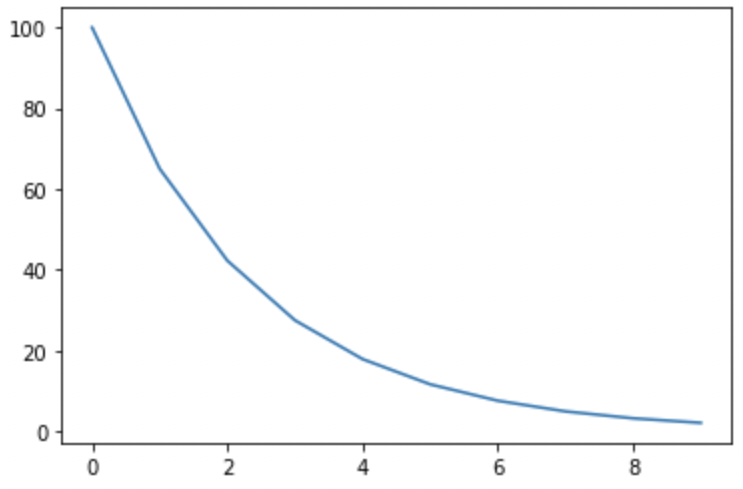

[MultiplicativeL](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling/notebook#2.-MultiplicativeL)

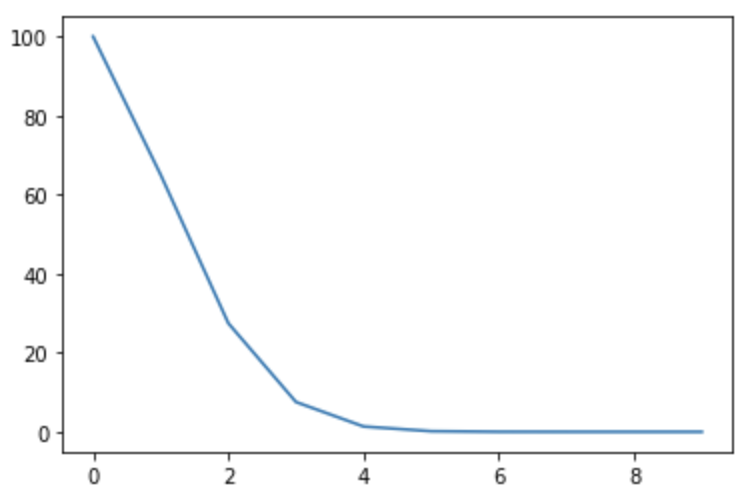

[StepLR](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling/notebook#3.-StepLR)

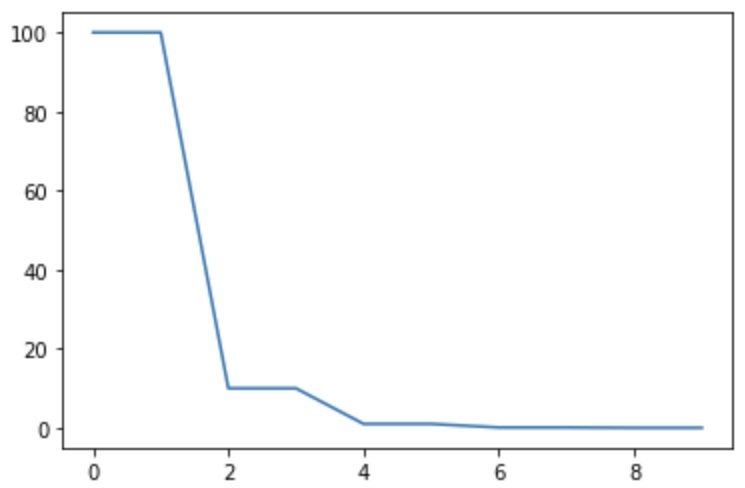

[MultiStepLR](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling/notebook#4.-MultiStepLR)

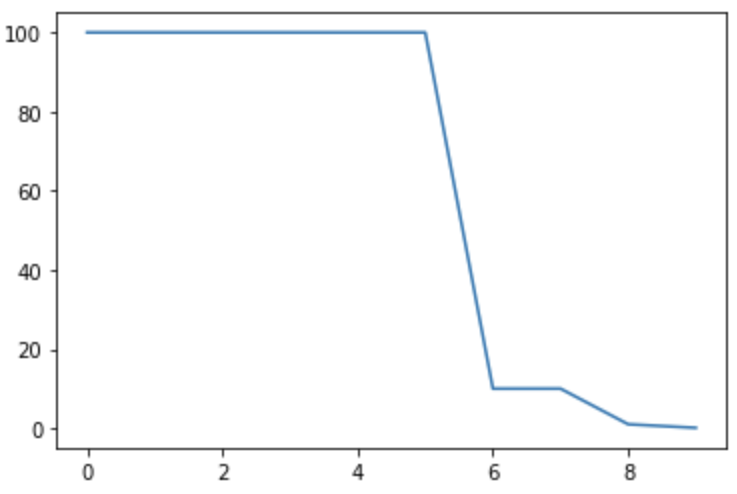

[ExponentialLR](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling/notebook#5.-ExponentialLR)

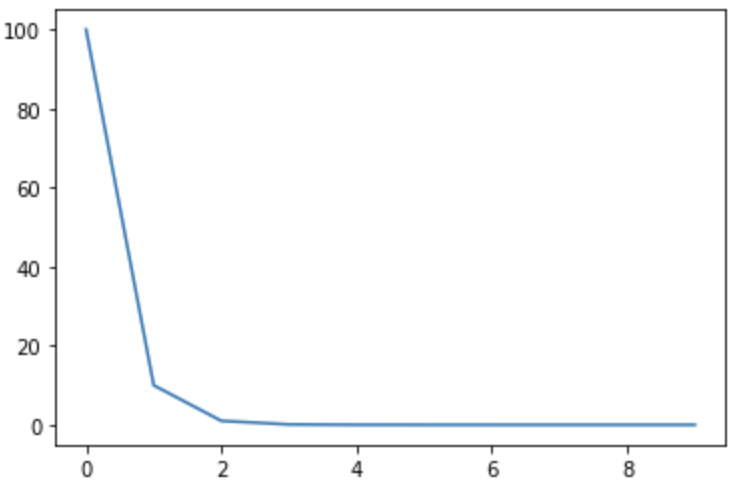

In [ ]:
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
lambda1 = lambda epoch: 0.65 ** epoch
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


###################### [{'boxes': tensor([[132.,   0., 435., 285.]]), 'labels': tensor([1]), 'image_id': tensor([1889]), 'area': tensor([86355.]), 'iscrowd': tensor([0])}, {'boxes': tensor([[235.,   0., 640., 315.]]), 'labels': tensor([1]), 'image_id': tensor([1210]), 'area': tensor([127575.]), 'iscrowd': tensor([0])}]


AssertionError: ignored

In [ ]:
os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/model")

# **FCOS: Fully Convolutional One-Stage Object Detection architecture** Training

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import os
os.chdir("/content/drive/MyDrive/PytorchObjectDetector/")
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import pandas as pd

from engine import train_one_epoch, evaluate
import utils
import transforms as T
import torchvision

### Looking at the **FCOS: Fully Convolutional One-Stage Object Detection architecture** architecture 

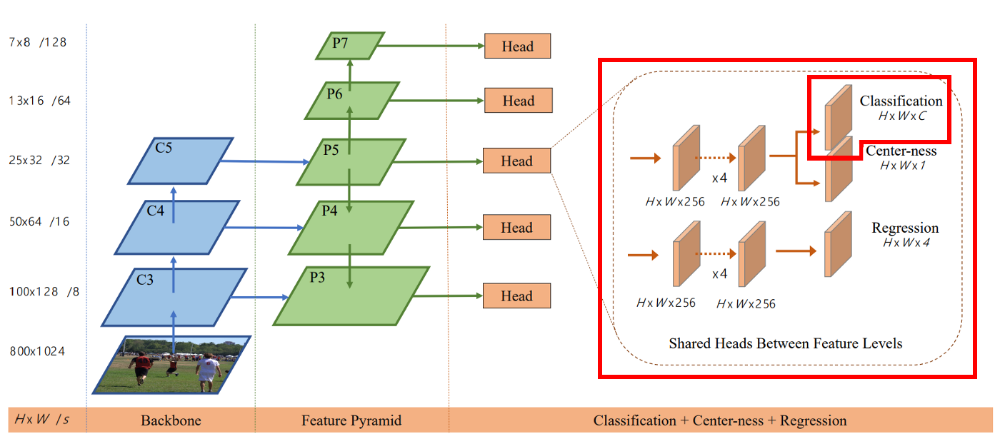

Final layer has 3 attributes
1.   Classification: Input-256 and Output-91(0:Background + 90:Classes) **TO BE TRAINED**
2.   Center-ness: Input-256 and Ouput-1
3.   Regression: Input-256 and Output-4(Bounding Box Coordinates)

### Load Pre trained FCOS model

In [ ]:
# Load Pre trained fcos_resnet50_fpn
model = torchvision.models.detection.fcos_resnet50_fpn(pretrained=True)

Downloading: "https://download.pytorch.org/models/fcos_resnet50_fpn_coco-99b0c9b7.pth" to /root/.cache/torch/hub/checkpoints/fcos_resnet50_fpn_coco-99b0c9b7.pth


  0%|          | 0.00/124M [00:00<?, ?B/s]

### Run block to know all the trainable layers of the model 

In [ ]:
for name, param in model.named_parameters():

    # If requires gradient parameters
    if param.requires_grad:    
        print(name)

backbone.body.layer2.0.conv1.weight
backbone.body.layer2.0.conv2.weight
backbone.body.layer2.0.conv3.weight
backbone.body.layer2.0.downsample.0.weight
backbone.body.layer2.1.conv1.weight
backbone.body.layer2.1.conv2.weight
backbone.body.layer2.1.conv3.weight
backbone.body.layer2.2.conv1.weight
backbone.body.layer2.2.conv2.weight
backbone.body.layer2.2.conv3.weight
backbone.body.layer2.3.conv1.weight
backbone.body.layer2.3.conv2.weight
backbone.body.layer2.3.conv3.weight
backbone.body.layer3.0.conv1.weight
backbone.body.layer3.0.conv2.weight
backbone.body.layer3.0.conv3.weight
backbone.body.layer3.0.downsample.0.weight
backbone.body.layer3.1.conv1.weight
backbone.body.layer3.1.conv2.weight
backbone.body.layer3.1.conv3.weight
backbone.body.layer3.2.conv1.weight
backbone.body.layer3.2.conv2.weight
backbone.body.layer3.2.conv3.weight
backbone.body.layer3.3.conv1.weight
backbone.body.layer3.3.conv2.weight
backbone.body.layer3.3.conv3.weight
backbone.body.layer3.4.conv1.weight
backbone.body.

### Check the Inputs and Outputs of the FCOS final layer 

In [ ]:
def get_model(selected_label = 77):

    # load an object detection model pre-trained on COCO
    model = torchvision.models.detection.fcos_resnet50_fpn(pretrained=True)
    
    selected_head_classification_head_cls_logits_weight = 0
    selected_head_classification_head_cls_logits_bias = 0

    # List out all the name of the parameters whose gradient can be altered for further training
    for name, param in model.named_parameters():

        # If requires gradient parameters
        if param.requires_grad:

            if name == "head.classification_head.cls_logits.bias" or name == "head.classification_head.cls_logits.weight":
                layer_para_name = "weight" if name.split('.')[-1]=='weight' else "bias"
                print("\nReplacing",name,"layer containing 90 class score",layer_para_name,", with",selected_label,"th class score",layer_para_name)          
                print("####################################")
                print("Original layer size(0:Background + 90 classes): ",param.data.size())
                # Reshaping bias
                if name.split('.')[-1] == 'bias':
                    selected_head_classification_head_cls_logits_bias = param.data[selected_label:selected_label+1]
                    param.data = torch.cat([param.data[:1], selected_head_classification_head_cls_logits_bias])
                # Reshaping weight
                if name.split('.')[-1] == 'weight':
                    selected_head_classification_head_cls_logits_weight = torch.tensor(param.data[selected_label][:].reshape([1, 256,3,3]))
                    param.data = torch.cat([param.data[:1], selected_head_classification_head_cls_logits_weight])
                print("Alteres layer size(0:Background +",selected_label,"th class): ",param.data.size())
                print("####################################")
                print("Finished enabling requires gradient for",name,"layer......")
                # Make the layer trainable
                param.requires_grad = True

            else:
                # Make the layer non-trainable
                param.requires_grad = False

    return model
get_model(77)


Replacing head.classification_head.cls_logits.weight layer containing 90 class score weight , with 77 th class score weight
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91, 256, 3, 3])
Alteres layer size(0:Background + 77 th class):  torch.Size([2, 256, 3, 3])
####################################
Finished enabling requires gradient for head.classification_head.cls_logits.weight layer......

Replacing head.classification_head.cls_logits.bias layer containing 90 class score bias , with 77 th class score bias
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91])
Alteres layer size(0:Background + 77 th class):  torch.Size([2])
####################################
Finished enabling requires gradient for head.classification_head.cls_logits.bias layer......


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


FCOS(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=1e

###Extract position of annotated objects from the csv file 

In [ ]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    #(xmin, ymin, xmax, ymax)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin","x_width", "y_height"]].values
    boxes_array[0][2]+=boxes_array[0][0]
    boxes_array[0][3]+=boxes_array[0][1]
    return boxes_array

###FemaleConnectorDataset class

In [ ]:
class FemaleConnectorDataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = sorted(os.listdir(os.path.join(root, "images")))
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        # load images and bounding boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file,self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            # print("img type: ",type(img),"target type: ",type(target))
            # print(target)
            img, target = self.transforms(img, target)
            
        return img, target
    def __len__(self):
            return len(self.imgs)

###Checking implementation of FemaleConnectorDataset

In [ ]:
dataset = FemaleConnectorDataset(root = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
data_file = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv")
dataset.__getitem__(9)

(<PIL.Image.Image image mode=RGB size=640x360 at 0x7FB29D4D2750>,
 {'area': tensor([117040.]),
  'boxes': tensor([[ 55.,  80., 473., 360.]]),
  'image_id': tensor([9]),
  'iscrowd': tensor([0]),
  'labels': tensor([1])})

Expected output

```
(<PIL.Image.Image image mode=RGB size=650x417 at 0x7FE20F358908>,  {'area': tensor([141120.]),
 'boxes': tensor([[ 81.,  88., 522., 408.]]),   
 'image_id': tensor([0]),   
 'iscrowd': tensor([0]),   
 'labels': tensor([1])})
```

Install appropriate torch version for the Cuda detected on colab
From this [INSTALLING PREVIOUS VERSIONS OF PYTORCH](https://pytorch.org/get-started/previous-versions/#installing-previous-versions-of-pytorch)

### Data augmentation 

In [ ]:
def get_transform(train):
   transformsL = []
   # converts the image, a PIL image, into a PyTorch Tensor
   transformsL.append(T.ToTensor())
   if train:
      # during training, randomly flip the training images
      # and ground-truth for data augmentation
      transformsL.append(T.RandomHorizontalFlip(0.5))
   return T.Compose(transformsL)


1.   Instantiate training and testing data classes
2.   Data loader to control image loading during training and testing



In [ ]:
# use our dataset and defined transformations
dataset = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/",
          data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
          transforms = get_transform(train=True))
dataset_test = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
               data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
               transforms = get_transform(train=False))
# split the dataset in train and test set
torch.manual_seed(1)
total_number_of_images = len(dataset)
test_percentage_images = 20
total_number_of_test_images = int(total_number_of_images*(test_percentage_images/100))
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-total_number_of_test_images])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-total_number_of_test_images:])
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=2, shuffle=True, num_workers=4,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=4,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1890 examples, 1512 are training and 378 testing


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Training the Model

### Use `GPU` if available else `CPU` 

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

### Load `Pre-trained` `weight` and `bias` of the 77th label `Cell Phone` as the trainable parameters and only detection for this model being trained

In [ ]:
# our dataset has two classes only - raccoon and not racoon
selected_label = 77
# get the model using our helper function
model = get_model(selected_label)
# move model to the right device
model.to(device)


Replacing head.classification_head.cls_logits.weight layer containing 90 class score weight , with 77 th class score weight
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91, 256, 3, 3])
Alteres layer size(0:Background + 77 th class):  torch.Size([2, 256, 3, 3])
####################################
Finished enabling requires gradient for head.classification_head.cls_logits.weight layer......

Replacing head.classification_head.cls_logits.bias layer containing 90 class score bias , with 77 th class score bias
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91])
Alteres layer size(0:Background + 77 th class):  torch.Size([2])
####################################
Finished enabling requires gradient for head.classification_head.cls_logits.bias layer......


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


FCOS(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=1e

### Parameters to be optimised (Only the `detection parameters` of the model `class score` and `bounding box`)

In [ ]:
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]

###Setting the Optimiser

**Adam** seems to be a good optimizer for a wide range of neural network training problems based on



1.   [Picking an Optimizer for Style Transfer](https://www.kdnuggets.com/2017/07/picking-optimizer-style-transfer.html)
2.   [Various Optimization Algorithms For Training Neural Network](https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6)
3.   [Seismic Full-Waveform Inversion Using Deep Learning Tools and Techniques](https://www.researchgate.net/figure/The-model-produced-by-Adam-is-close-to-the-true-model-while-L-BFGS-Bs-output-despite_fig3_322652684)
4.   [A Comparison of Selected Optimization Methods for Neural Networks](http://kth.diva-portal.org/smash/get/diva2:1438308/FULLTEXT01.pdf)



In [ ]:
# optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

In [ ]:
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
lambda1 = lambda epoch: 0.65 ** epoch
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


###################### [{'boxes': tensor([[ 185.,  749.,  726., 1344.]]), 'labels': tensor([1]), 'image_id': tensor([898]), 'area': tensor([321895.]), 'iscrowd': tensor([0])}, {'boxes': tensor([[  0., 229., 319., 593.]]), 'labels': tensor([1]), 'image_id': tensor([478]), 'area': tensor([116116.]), 'iscrowd': tensor([0])}]


RuntimeError: ignored

Raised the issue in the github repository

[Transfer learning using pre trained objective detection model FCOS: Fully Convolutional One-Stage Object Detection architecture #5932](https://github.com/pytorch/vision/issues/5932)

In [ ]:
# os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/model")

# **Faster R-CNN model with a ResNet-50-FPN backbone** Training

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import os
os.chdir("/content/drive/MyDrive/PytorchObjectDetector/")
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import pandas as pd

from engine import train_one_epoch, evaluate
import utils
import transforms as T
import torchvision

### Load Pre trained Faster RCNN ResNet50 model

In [ ]:
# Load Pre trained fcos_resnet50_fpn
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

### Run block to know all the trainable layers of the model 

In [ ]:
for name, param in model.named_parameters():

    # If requires gradient parameters
    if param.requires_grad: 
      if name == 'rpn.head.cls_logits.weight' or name == 'rpn.head.cls_logits.bias'\
       or name == 'roi_heads.box_predictor.cls_score.weight' or name == 'roi_heads.box_predictor.cls_score.bias':
        print(name,'\n',param.shape)

rpn.head.cls_logits.weight 
 torch.Size([3, 256, 1, 1])
rpn.head.cls_logits.bias 
 torch.Size([3])
roi_heads.box_predictor.cls_score.weight 
 torch.Size([91, 1024])
roi_heads.box_predictor.cls_score.bias 
 torch.Size([91])


In [ ]:

def get_model(selected_label = 77):

  selected_roi_heads_box_predictor_cls_score_weight = 0
  selected_roi_heads_box_predictor_cls_score_bias = 0

  for name, param in model.named_parameters():

      # If requires gradient parameters
      if param.requires_grad: 
        if name == 'roi_heads.box_predictor.cls_score.weight' or\
          name == 'roi_heads.box_predictor.cls_score.bias':
          layer_para_name = "weight" if name.split('.')[-1]=='weight' else "bias"
          print("\nReplacing",name,"layer containing 90 class score",layer_para_name,", with",selected_label,"th class score",layer_para_name)          
          print("####################################")
          print("Original layer size(0:Background + 90 classes): ",param.data.size())
          # Reshaping bias
          if name.split('.')[-1] == 'bias':
            if param.data.size()==torch.Size([2]):
                print("weights are ready loaded.....")
            else:
                selected_head_classification_head_cls_logits_bias = param.data[selected_label:selected_label+1]
                # Add background + selected class bias
                param.data = torch.cat([param.data[:1], selected_head_classification_head_cls_logits_bias])

          # Reshaping weight
          if name.split('.')[-1] == 'weight':
              if param.data.size()==torch.Size([2, 1024]):
                print("weights are ready loaded.....")
              else:
                selected_head_classification_head_cls_logits_weight = torch.tensor(param.data[selected_label][:].reshape([1, 1024]))
                # Add background + selected class weight
                param.data = torch.cat([param.data[:1], selected_head_classification_head_cls_logits_weight])
          print("Alteres layer size(0:Background +",selected_label,"th class): ",param.data.size())
          print("####################################")
          # Make the layer trainable
          param.requires_grad = True
          print("Finished enabling requires gradient for",name,"layer......")
          
        else:
          # Make the layer non-trainable
          param.requires_grad = False
  return model

###Extract position of annotated objects from the csv file 

In [ ]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    #(xmin, ymin, xmax, ymax)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin","x_width", "y_height"]].values
    boxes_array[0][2]+=boxes_array[0][0]
    boxes_array[0][3]+=boxes_array[0][1]
    return boxes_array

###FemaleConnectorDataset class

In [ ]:
class FemaleConnectorDataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = sorted(os.listdir(os.path.join(root, "images")))
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        # load images and bounding boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file,self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            # print("img type: ",type(img),"target type: ",type(target))
            # print(target)
            img, target = self.transforms(img, target)
            
        return img, target
    def __len__(self):
            return len(self.imgs)

###Checking implementation of FemaleConnectorDataset

In [ ]:
dataset = FemaleConnectorDataset(root = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
data_file = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv")
dataset.__getitem__(9)

(<PIL.Image.Image image mode=RGB size=640x360 at 0x7F66A01EA350>,
 {'area': tensor([117040.]),
  'boxes': tensor([[ 55.,  80., 473., 360.]]),
  'image_id': tensor([9]),
  'iscrowd': tensor([0]),
  'labels': tensor([1])})

Expected output

```
(<PIL.Image.Image image mode=RGB size=650x417 at 0x7FE20F358908>,  {'area': tensor([141120.]),
 'boxes': tensor([[ 81.,  88., 522., 408.]]),   
 'image_id': tensor([0]),   
 'iscrowd': tensor([0]),   
 'labels': tensor([1])})
```

Install appropriate torch version for the Cuda detected on colab
From this [INSTALLING PREVIOUS VERSIONS OF PYTORCH](https://pytorch.org/get-started/previous-versions/#installing-previous-versions-of-pytorch)

### Data augmentation 

In [ ]:
def get_transform(train):
   transformsL = []
   # converts the image, a PIL image, into a PyTorch Tensor
   transformsL.append(T.ToTensor())
   if train:
      # during training, randomly flip the training images
      # and ground-truth for data augmentation
      transformsL.append(T.RandomHorizontalFlip(0.5))
   return T.Compose(transformsL)


1.   Instantiate training and testing data classes
2.   Data loader to control image loading during training and testing



In [ ]:
# use our dataset and defined transformations
dataset = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/",
          data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
          transforms = get_transform(train=True))
dataset_test = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
               data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
               transforms = get_transform(train=False))
# split the dataset in train and test set
torch.manual_seed(1)
total_number_of_images = len(dataset)
test_percentage_images = 20
total_number_of_test_images = int(total_number_of_images*(test_percentage_images/100))
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-total_number_of_test_images])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-total_number_of_test_images:])
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=8, shuffle=True, num_workers=4,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=4,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1890 examples, 1512 are training and 378 testing


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Training the Model

### Use `GPU` if available else `CPU` 

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("Selected:",device)

Selected: cuda


### Load `Pre-trained` `weight` and `bias` of the 77th label `Cell Phone` as the trainable parameters and only detection for this model being trained

In [ ]:
# our dataset has two classes only - raccoon and not racoon
selected_label = 77
# get the model using our helper function
model = get_model(selected_label)
# move model to the right device
model.to(device)


Replacing roi_heads.box_predictor.cls_score.weight layer containing 90 class score weight , with 77 th class score weight
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91, 1024])
Alteres layer size(0:Background + 77 th class):  torch.Size([2, 1024])
####################################
Finished enabling requires gradient for roi_heads.box_predictor.cls_score.weight layer......

Replacing roi_heads.box_predictor.cls_score.bias layer containing 90 class score bias , with 77 th class score bias
####################################
Original layer size(0:Background + 90 classes):  torch.Size([91])
Alteres layer size(0:Background + 77 th class):  torch.Size([2])
####################################
Finished enabling requires gradient for roi_heads.box_predictor.cls_score.bias layer......


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

### Parameters to be optimised (Only the `detection parameters` of the model `class score` and `bounding box`)

In [ ]:
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]

###Setting the Optimiser

**Adam** seems to be a good optimizer for a wide range of neural network training problems based on



1.   [Picking an Optimizer for Style Transfer](https://www.kdnuggets.com/2017/07/picking-optimizer-style-transfer.html)
2.   [Various Optimization Algorithms For Training Neural Network](https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6)
3.   [Seismic Full-Waveform Inversion Using Deep Learning Tools and Techniques](https://www.researchgate.net/figure/The-model-produced-by-Adam-is-close-to-the-true-model-while-L-BFGS-Bs-output-despite_fig3_322652684)
4.   [A Comparison of Selected Optimization Methods for Neural Networks](http://kth.diva-portal.org/smash/get/diva2:1438308/FULLTEXT01.pdf)



### Using Adam with LambdaLR 

In [ ]:
# optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

In [ ]:
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
lambda1 = lambda epoch: 0.65 ** epoch
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/model")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


###################### [{'boxes': tensor([[ 49.,   6., 423., 355.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1856], device='cuda:0'), 'area': tensor([130526.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[229.,   0., 606., 337.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1726], device='cuda:0'), 'area': tensor([127049.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 60., 320., 184., 425.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1025], device='cuda:0'), 'area': tensor([13020.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[  0., 166., 378., 360.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1705], device='cuda:0'), 'area': tensor([73332.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 41.,  53., 325., 316.]

### Using SGD with StepLR 

In [ ]:
optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
# optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

In [ ]:
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
# lambda1 = lambda epoch: 0.65 ** epoch
# lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
# os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


###################### [{'boxes': tensor([[ 49.,   6., 423., 355.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1856], device='cuda:0'), 'area': tensor([130526.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[229.,   0., 606., 337.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1726], device='cuda:0'), 'area': tensor([127049.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 60., 320., 184., 425.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1025], device='cuda:0'), 'area': tensor([13020.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[  0., 166., 378., 360.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1705], device='cuda:0'), 'area': tensor([73332.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 41.,  53., 325., 316.]

FileExistsError: ignored

In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/sdgsteplrmodel")

# **Faster R-CNN model with a ResNet-50-FPN backbone** Training With all weights in final layer

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
import os
os.chdir("/content/drive/MyDrive/PytorchObjectDetector/")
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import pandas as pd

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from engine import train_one_epoch, evaluate
import utils
import transforms as T
import torchvision

### Load Pre trained Faster RCNN ResNet50 model

In [ ]:
# Load Pre trained fcos_resnet50_fpn
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

### Run block to know all the trainable layers of the model 

In [ ]:
for name, param in model.named_parameters():

    # If requires gradient parameters
    if param.requires_grad: 
      if name == 'rpn.head.cls_logits.weight' or name == 'rpn.head.cls_logits.bias'\
       or name == 'roi_heads.box_predictor.cls_score.weight' or name == 'roi_heads.box_predictor.cls_score.bias':
        print(name,'\n',param.shape)

rpn.head.cls_logits.weight 
 torch.Size([3, 256, 1, 1])
rpn.head.cls_logits.bias 
 torch.Size([3])
roi_heads.box_predictor.cls_score.weight 
 torch.Size([91, 1024])
roi_heads.box_predictor.cls_score.bias 
 torch.Size([91])


In [ ]:
def get_model(num_classes):
    # load an object detection model pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new on
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features,num_classes)

    return model


###Extract position of annotated objects from the csv file 

In [ ]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    #(xmin, ymin, xmax, ymax)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin","x_width", "y_height"]].values
    boxes_array[0][2]+=boxes_array[0][0]
    boxes_array[0][3]+=boxes_array[0][1]
    return boxes_array

###FemaleConnectorDataset class

In [ ]:
class FemaleConnectorDataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = sorted(os.listdir(os.path.join(root, "images")))
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        # load images and bounding boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file,self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            # print("img type: ",type(img),"target type: ",type(target))
            # print(target)
            img, target = self.transforms(img, target)
            
        return img, target
    def __len__(self):
            return len(self.imgs)

###Checking implementation of FemaleConnectorDataset

In [ ]:
dataset = FemaleConnectorDataset(root = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
data_file = "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv")
dataset.__getitem__(9)

(<PIL.Image.Image image mode=RGB size=640x360 at 0x7FFAA4AABFD0>,
 {'area': tensor([117040.]),
  'boxes': tensor([[ 55.,  80., 473., 360.]]),
  'image_id': tensor([9]),
  'iscrowd': tensor([0]),
  'labels': tensor([1])})

Expected output

```
(<PIL.Image.Image image mode=RGB size=650x417 at 0x7FE20F358908>,  {'area': tensor([141120.]),
 'boxes': tensor([[ 81.,  88., 522., 408.]]),   
 'image_id': tensor([0]),   
 'iscrowd': tensor([0]),   
 'labels': tensor([1])})
```

Install appropriate torch version for the Cuda detected on colab
From this [INSTALLING PREVIOUS VERSIONS OF PYTORCH](https://pytorch.org/get-started/previous-versions/#installing-previous-versions-of-pytorch)

### Data augmentation 

In [ ]:
def get_transform(train):
   transformsL = []
   # converts the image, a PIL image, into a PyTorch Tensor
   transformsL.append(T.ToTensor())
   if train:
      # during training, randomly flip the training images
      # and ground-truth for data augmentation
      transformsL.append(T.RandomHorizontalFlip(0.5))
   return T.Compose(transformsL)


1.   Instantiate training and testing data classes
2.   Data loader to control image loading during training and testing



In [ ]:
# use our dataset and defined transformations
dataset = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/",
          data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
          transforms = get_transform(train=True))
dataset_test = FemaleConnectorDataset(root= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset",
               data_file= "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/data/femaleconnector_labels.csv",
               transforms = get_transform(train=False))
# split the dataset in train and test set
torch.manual_seed(1)
total_number_of_images = len(dataset)
test_percentage_images = 20
total_number_of_test_images = int(total_number_of_images*(test_percentage_images/100))
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-total_number_of_test_images])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-total_number_of_test_images:])
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=2, shuffle=True, num_workers=4,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=4,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1890 examples, 1512 are training and 378 testing


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Training the Model

### Use `GPU` if available else `CPU` 

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("Selected:",device)

Selected: cpu


### Load `Pre-trained` `weight` and `bias` of the 77th label `Cell Phone` as the trainable parameters and only detection for this model being trained

In [ ]:
# our dataset has two classes only - raccoon and not racoon
num_classes = 2
# get the model using our helper function
model = get_model(num_classes)
# move model to the right device
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

### Parameters to be optimised (Only the `detection parameters` of the model `class score` and `bounding box`)

In [ ]:
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]

###Setting the Optimiser

**Adam** seems to be a good optimizer for a wide range of neural network training problems based on



1.   [Picking an Optimizer for Style Transfer](https://www.kdnuggets.com/2017/07/picking-optimizer-style-transfer.html)
2.   [Various Optimization Algorithms For Training Neural Network](https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6)
3.   [Seismic Full-Waveform Inversion Using Deep Learning Tools and Techniques](https://www.researchgate.net/figure/The-model-produced-by-Adam-is-close-to-the-true-model-while-L-BFGS-Bs-output-despite_fig3_322652684)
4.   [A Comparison of Selected Optimization Methods for Neural Networks](http://kth.diva-portal.org/smash/get/diva2:1438308/FULLTEXT01.pdf)



### Using Adam with LambdaLR 

In [ ]:
# optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

In [ ]:
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
lambda1 = lambda epoch: 0.65 ** epoch
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs using GPU stopped

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
# os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/adamlambdalrstandardstepsmodel")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch: [0]  [  0/756]  eta: 0:22:43  lr: 0.000012  loss: 0.8456 (0.8456)  loss_classifier: 0.6389 (0.6389)  loss_box_reg: 0.1814 (0.1814)  loss_objectness: 0.0209 (0.0209)  loss_rpn_box_reg: 0.0046 (0.0046)  time: 1.8039  data: 0.6027  max mem: 4156
Epoch: [0]  [ 10/756]  eta: 0:10:54  lr: 0.000078  loss: 0.3303 (0.4198)  loss_classifier: 0.1554 (0.2573)  loss_box_reg: 0.1496 (0.1465)  loss_objectness: 0.0052 (0.0087)  loss_rpn_box_reg: 0.0046 (0.0072)  time: 0.8774  data: 0.0614  max mem: 4576
Epoch: [0]  [ 20/756]  eta: 0:10:00  lr: 0.000144  loss: 0.2340 (0.3221)  loss_classifier: 0.0882 (0.1711)  loss_box_reg: 0.1303 (0.1372)  loss_objectness: 0.0052 (0.0074)  loss_rpn_box_reg: 0.0045 (0.0064)  time: 0.7669  data: 0.0076  max mem: 4576
Epoch: [0]  [ 30/756]  eta: 0:09:52  lr: 0.000210  loss: 0.1910 (0.2787)  loss_classifier: 0.0618 (0.1360)  loss_box_reg: 0.1154 (0.1230)  loss_objectness: 0.0040 (0.0121)  loss_rpn_box_reg: 0.0055 (0.0076)  time: 0.7827  data: 0.0085  max mem: 4576


### CPU since GPU stopped

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
# os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/adamlambdalrstandardstepsmodel")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch: [0]  [  0/756]  eta: 15:13:42  lr: 0.000012  loss: 0.8285 (0.8285)  loss_classifier: 0.6376 (0.6376)  loss_box_reg: 0.1814 (0.1814)  loss_objectness: 0.0050 (0.0050)  loss_rpn_box_reg: 0.0046 (0.0046)  time: 72.5166  data: 0.9270  max mem: 0
Epoch: [0]  [ 10/756]  eta: 11:32:39  lr: 0.000078  loss: 0.3187 (0.4199)  loss_classifier: 0.1535 (0.2585)  loss_box_reg: 0.1411 (0.1461)  loss_objectness: 0.0068 (0.0080)  loss_rpn_box_reg: 0.0046 (0.0072)  time: 55.7094  data: 0.0897  max mem: 0
Epoch: [0]  [ 20/756]  eta: 10:54:40  lr: 0.000144  loss: 0.2076 (0.3151)  loss_classifier: 0.0812 (0.1691)  loss_box_reg: 0.1252 (0.1316)  loss_objectness: 0.0059 (0.0077)  loss_rpn_box_reg: 0.0048 (0.0066)  time: 52.4130  data: 0.0065  max mem: 0
Epoch: [0]  [ 30/756]  eta: 10:46:00  lr: 0.000210  loss: 0.1694 (0.2621)  loss_classifier: 0.0567 (0.1313)  loss_box_reg: 0.1053 (0.1182)  loss_objectness: 0.0026 (0.0059)  loss_rpn_box_reg: 0.0048 (0.0068)  time: 52.1122  data: 0.0068  max mem: 0


KeyboardInterrupt: ignored

### Total number of parameters

In [1]:
import torch
from torchvision import models
from torchsummary import summary

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
frcnn = model().to(device)

summary(frcnn, (3, 224, 224))

NameError: ignored

In [5]:
!pip show torchsummary

Name: torchsummary
Version: 1.5.1
Summary: Model summary in PyTorch similar to `model.summary()` in Keras
Home-page: https://github.com/sksq96/pytorch-summary
Author: Shubham Chandel @sksq96
Author-email: shubham.zeez@gmail.com
License: UNKNOWN
Location: /usr/local/lib/python3.7/dist-packages
Requires: 
Required-by: 


In [4]:
import torch
from torchsummary import summary

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
loaded_model = model().to(device)

summary(loaded_model, (3, 224, 224))


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

TypeError: ignored

In [ ]:
import torchvision

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)

pytorch_total_params = sum(p.numel() for p in model.parameters())
print("Total parameters: ",pytorch_total_params)
pytorch_trainable_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total trainable parameters: ",pytorch_trainable_total_params)

Total parameters:  41755286
Total trainable parameters:  41532886


In [ ]:
import torch
from torchsummary import summary

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
loaded_model = model.to(device)

summary(loaded_model)

TypeError: ignored

In [ ]:
!pip install -U fvcore

     |████████████████████████████████| 50 kB 3.2 MB/s 
     |████████████████████████████████| 596 kB 14.9 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220506-py3-none-any.whl size=61284 sha256=a050462854de27a28decc71703e05ff55af67ea31d601a183fc99b6c3a982ad1
  Stored in directory: /root/.cache/pip/wheels/f5/ef/3c/708de8799f89f0871bd209866831fe3885db93fa090608fa73
Successfully built fvcore
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
from fvcore.nn import FlopCountAnalysis
import torchvision
from PIL import Image
import torch
import torchvision.transforms as T

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)
img_path = "/content/drive/MyDrive/Tensorflow2/dataset/images/femaleconnector-1751.jpg"
img = Image.open(img_path)
transform = T.Compose([T.ToTensor()])
img = transform(img)
# pred = model([img])
flops = FlopCountAnalysis(model, [img])
flops.total()

flops.by_operator()

flops.by_module()
flops.by_module_and_operator()

ValueError: ignored

### Using SGD with StepLR 

In [ ]:
optimizer = torch.optim.SGD(params, lr=0.005,momentum=0.9, weight_decay=0.0005)
# optimizer = torch.optim.Adam(params,lr=0.005,betas=(0.9,0.999),eps=1e-08,weight_decay=0.0005,amsgrad=False)

In [ ]:
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
# lambda1 = lambda epoch: 0.65 ** epoch
# lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

### Loop for epochs

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch,print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
# os.mkdir("/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


###################### [{'boxes': tensor([[ 49.,   6., 423., 355.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1856], device='cuda:0'), 'area': tensor([130526.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[229.,   0., 606., 337.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1726], device='cuda:0'), 'area': tensor([127049.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 60., 320., 184., 425.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1025], device='cuda:0'), 'area': tensor([13020.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[  0., 166., 378., 360.]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([1705], device='cuda:0'), 'area': tensor([73332.], device='cuda:0'), 'iscrowd': tensor([0], device='cuda:0')}, {'boxes': tensor([[ 41.,  53., 325., 316.]

FileExistsError: ignored

In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/PytorchObjectDetector/femaleconnector_dataset/sdgsteplrmodel")

In [ ]:
#GPU
!pip install torch==1.10.1+cu111 torchvision==0.11.2+cu111 torchaudio==0.10.1 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████▌                   | 834.1 MB 1.6 MB/s eta 0:13:52tcmalloc: large alloc 1147494400 bytes == 0x5652a9632000 @  0x7f8b9a146615 0x56526f9ba17c 0x56526fa9a47a 0x56526f9bcf9d 0x56526faaed4d 0x56526fa30ec8 0x56526fa2ba2e 0x56526f9be88a 0x56526fa30d30 0x56526fa2ba2e 0x56526f9be88a 0x56526fa2d719 0x56526faafb76 0x56526fa2cd95 0x56526faafb76 0x56526fa2cd95 0x56526faafb76 0x56526fa2cd95 0x56526f9bece9 0x56526fa02579 0x56526f9bd902 0x56526fa30c4d 0x56526fa2ba2e 0x56526f9be88a 0x56526fa2d719 0x56526fa2ba2e 0x56526f9be88a 0x56526fa2c8f6 0x56526f9be7aa 0x56526fa2cb4f 0x56526fa2ba2e
     |███████████████▉                | 1055.7 MB 1.8 MB/s eta 0:10:13tcmalloc: large alloc 1434370048 bytes == 0x5652edc88000 @  0x7f8b9a146615 0x56526f9ba17c 0x56526fa9a47a 0x56526f9bcf9d 0x56526faaed4d 0x56526fa30ec8 0x56526fa2ba2e 0x56526f9be88a 0x56526fa30d30 0x56526fa2ba2e 0x56526f9be88a 0x56526fa2d719 0x56526faafb76 0x56526fa2cd